# Canny Edge Detection

### Importing Libraries and Image Dataset

In [ ]:
# Mounting google drive
from google.colab import drive
drive.mount('/content/drive')

# Downloading all the required libraries


# Importing all the required libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib import style
from glob import glob
from natsort import natsorted
from tqdm import tqdm
from scipy.signal import convolve2d
import pandas as pd
import scipy
style.use('ggplot')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Loading all the images in the drive
gt_images = []

for files in tqdm(natsorted(glob('/content/drive/My Drive/ES666CV/images/A/*'))):
    gt_images.append(cv2.imread(files, 1))

gt_images = np.array(gt_images) # Only possible because all images are of same size

100%|██████████| 4/4 [00:00<00:00, 183.39it/s]


In [ ]:
def show_image_grid(images, M, N, title='Title'):
    # Assuming 'images' is a numpy array of shape (num_images, height, width, channels)
    fig, axes = plt.subplots(M, N, figsize=(N * 2, M * 2))

    if len(images.shape) < 4:
        images = np.expand_dims(images.copy(), axis=0)

    fig.suptitle(title)
    for i in range(M):
        for j in range(N):
            if M==1 and N==1:
                ax = axes
            elif M == 1 or N==1:
                ax = axes[max(i, j)]
            else:
                ax = axes[i, j]
            index = i * N + j
            if index < images.shape[0]:
                ax.imshow(cv2.cvtColor(images[index], cv2.COLOR_BGR2RGB))
            ax.axis('off')
    plt.tight_layout()
    plt.show()

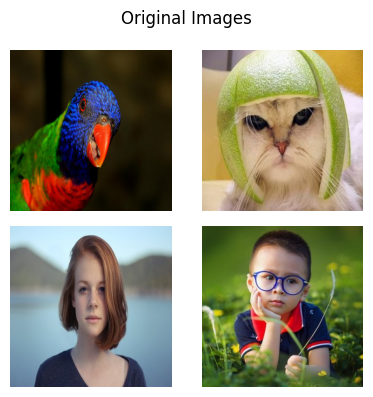

In [ ]:
show_image_grid(gt_images, 2, 2, 'Original Images')

### Noised Images

In [ ]:
def add_impulse_noise(image, noise_prob):
    # Write your code here

    m, n, c = image.shape
    noisy_image = np.copy(image)

    # Salt noise
    num_salt = np.ceil(noise_prob * m * n).astype(int)
    salt_coords = [np.random.randint(0, i, num_salt) for i in (m, n)]
    noisy_image[salt_coords[0], salt_coords[1], :] = 1

    # Pepper noise
    num_pepper = np.ceil(noise_prob * m * n).astype(int)
    pepper_coords = [np.random.randint(0, i, num_pepper) for i in (m, n)]
    noisy_image[pepper_coords[0], pepper_coords[1], :] = 0

    return noisy_image

def add_gaussian_noise(image, mean, std):
    # Write your code here

    m, n, c = image.shape

    noise = np.random.normal(mean, std, (m, n, c))
    noisy_image = image + noise
    noisy_image = np.clip(noisy_image, 0, 255)

    return noisy_image.astype(np.uint8)

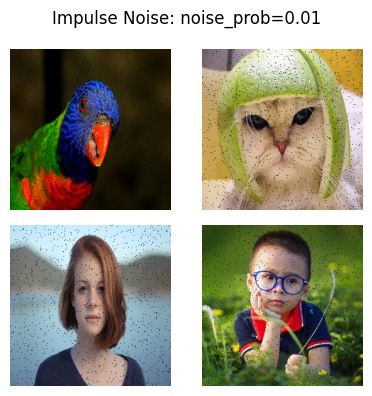

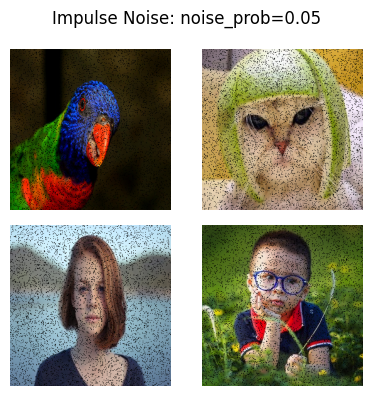

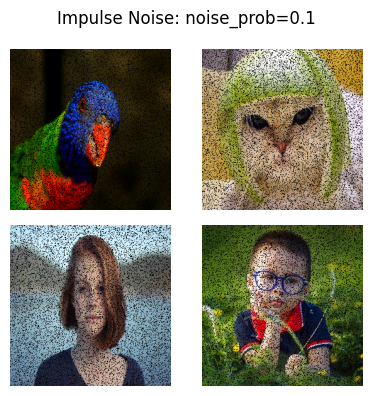

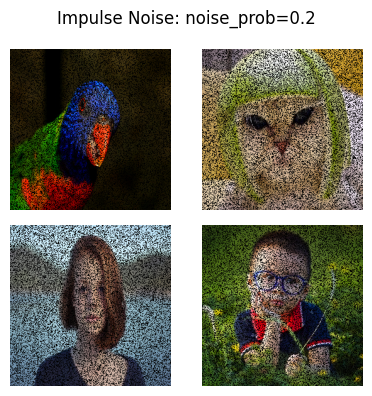

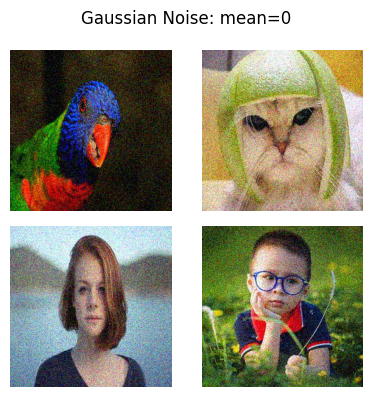

...

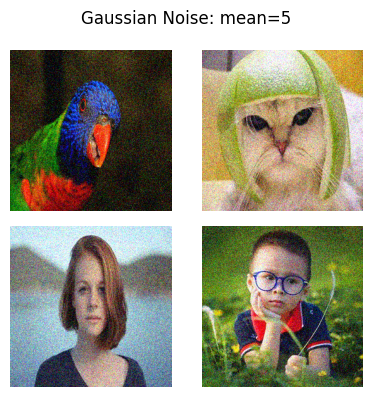

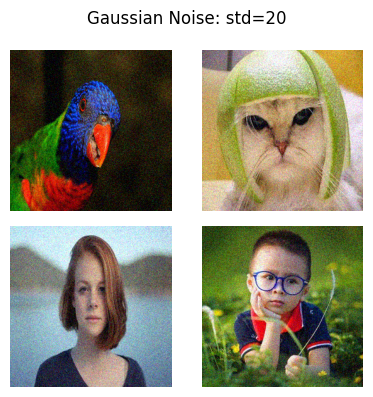

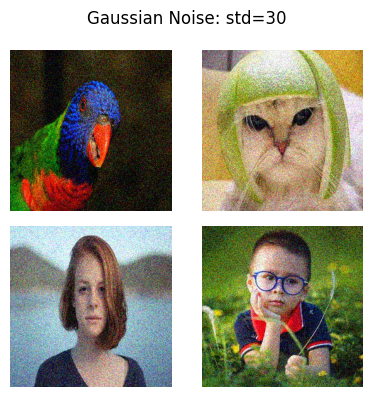

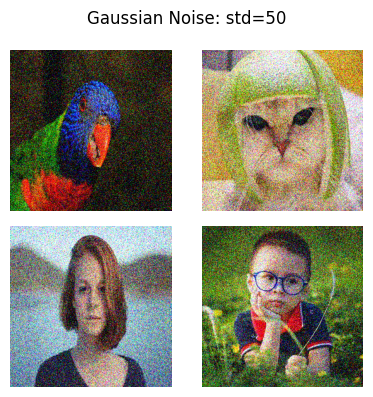

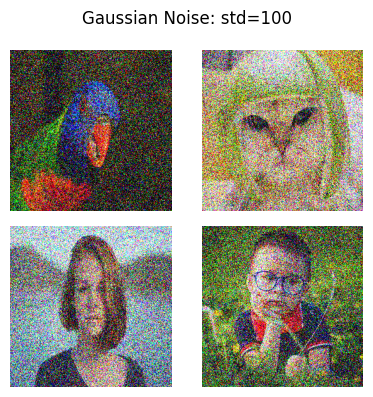

In [ ]:
# Write code here for variation in noise parameter

# Define the range
sigmas = [20,30,50,100]
noise_probs = [0.01,0.05,0.1,0.2]
means = [0,1,2,5]
impulse_noisy_images_all = []
for noise_prob in noise_probs:
    impulse_noisy_images_noise_prob_plot = []
    for image in gt_images:
        impulse_noisy_images_noise_prob_plot.append(add_impulse_noise(image, noise_prob=noise_prob))
    impulse_noisy_images_noise_prob_plot = np.array(impulse_noisy_images_noise_prob_plot)
    impulse_noisy_images_all.append(impulse_noisy_images_noise_prob_plot)
    show_image_grid(impulse_noisy_images_noise_prob_plot, M=2, N=2, title=f'Impulse Noise: noise_prob={noise_prob}')

gaussian_noisy_images_mean_all = []
for mean in means:
    gaussian_noisy_images_mean_plot = []
    for image in gt_images:
        gaussian_noisy_images_mean_plot.append(add_gaussian_noise(image, mean=mean, std=30))
    gaussian_noisy_images_mean_plot = np.array(gaussian_noisy_images_mean_plot )
    gaussian_noisy_images_mean_all.append(gaussian_noisy_images_mean_plot)
    show_image_grid(gaussian_noisy_images_mean_plot, M=2, N=2, title=f'Gaussian Noise: mean={mean}')

gaussian_noisy_images_std_all = []
for sigma in sigmas:
    gaussian_noisy_images_sigma_plot = []
    for image in gt_images:
        gaussian_noisy_images_sigma_plot.append(add_gaussian_noise(image, mean=0, std=sigma))
    gaussian_noisy_images_sigma_plot = np.array(gaussian_noisy_images_sigma_plot)
    gaussian_noisy_images_std_all.append(gaussian_noisy_images_sigma_plot)
    show_image_grid(gaussian_noisy_images_sigma_plot , M=2, N=2, title=f'Gaussian Noise: std={sigma}')

### Filtering the Noise

In [ ]:
def apply_box_filter(image, kernel_size):
    # Write Your Code Here

    m,n,c = image.shape

    box_filter = np.ones((kernel_size, kernel_size))
    box_filter = box_filter/(kernel_size**2)

    blurred_image = []
    for i in range(c):
      blurred_image.append(scipy.signal.convolve2d(image[:,:,i],box_filter,mode='same'))
    blurred_image = np.stack(blurred_image,axis=-1)

    blurred_image = np.clip(blurred_image, 0, 255)

    return blurred_image.astype(np.uint8)



def apply_gaussian_filter(image, kernel_size, sigma):
    # Write your code here

    m, n, c = image.shape

    ax = np.linspace(-(kernel_size - 1) / 2., (kernel_size - 1) / 2., kernel_size)
    xx, yy = np.meshgrid(ax, ax)
    gaussian_filter = np.exp(-0.5 * (np.square(xx) + np.square(yy)) / np.square(sigma))
    gaussian_filter = gaussian_filter / np.sum(gaussian_filter)


    blurred_image = []
    for i in range(c):
        blurred_channel = scipy.signal.convolve2d(image[:, :, i], gaussian_filter, mode='same', boundary='fill', fillvalue=0)
        blurred_image.append(blurred_channel)
    blurred_image = np.stack(blurred_image, axis=-1)
    blurred_image = np.clip(blurred_image, 0, 255)

    return blurred_image.astype(np.uint8)

def apply_median_filter(image, kernel_size):
    # Write your code here

    m, n, c = image.shape

    pad_size = kernel_size // 2
    padded_image = np.pad(image, ((pad_size, pad_size), (pad_size, pad_size), (0, 0)), mode='edge')

    filtered_image = np.zeros((m, n, c), dtype=image.dtype)

    for i in range(m):
        for j in range(n):
            for k in range(c):
                window = padded_image[i:i+kernel_size, j:j+kernel_size, k]
                median_value = np.median(window)
                filtered_image[i, j, k] = median_value
    filtered_image = np.clip(filtered_image, 0, 255)
    return filtered_image.astype(np.uint8)

----------------- Filters on Impulse noise with vaying Noise Prob ----------------



Implulse Noise with Noise Prob = 0.01



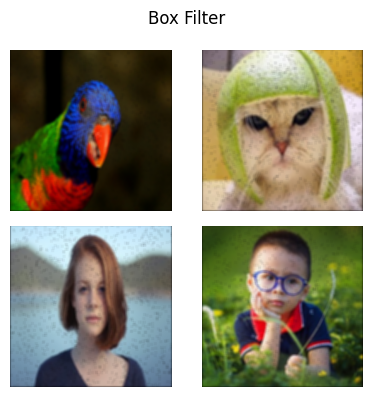

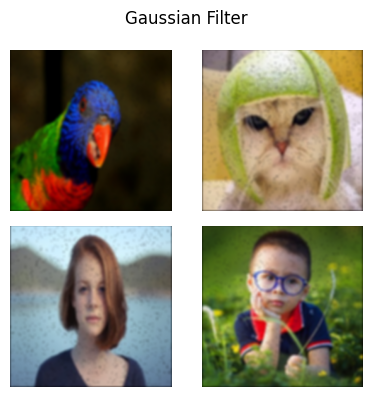

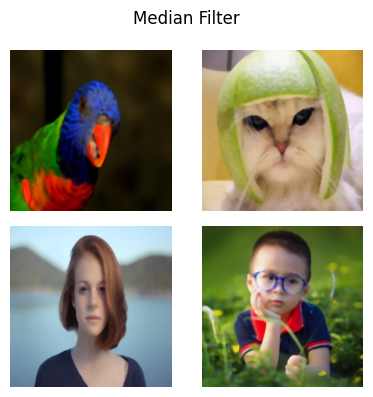


Implulse Noise with Noise Prob = 0.05



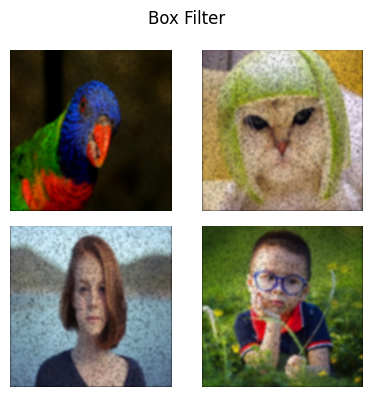

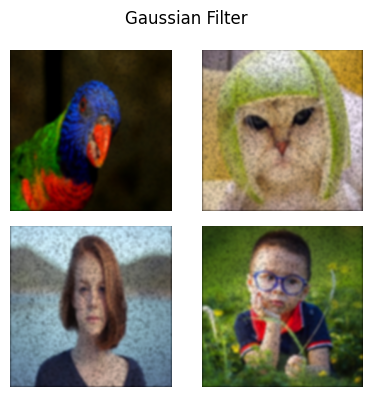

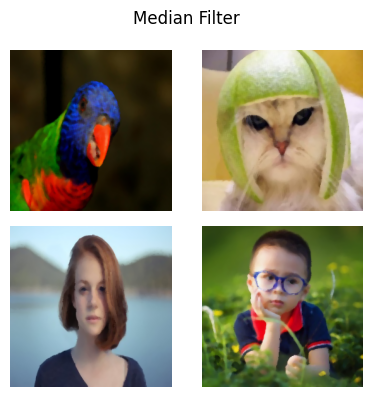


Implulse Noise with Noise Prob = 0.1



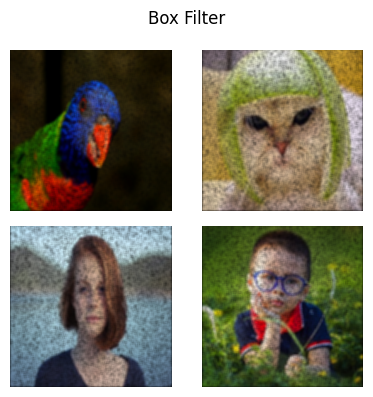

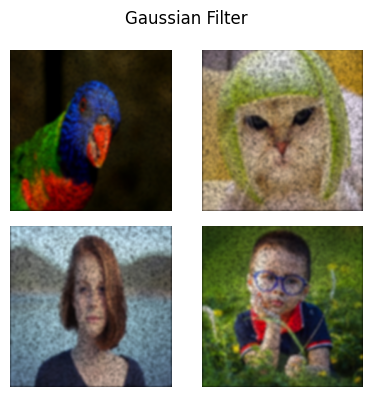

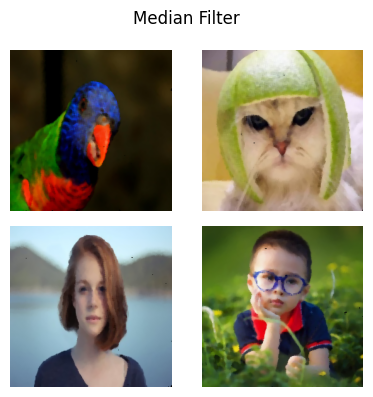


Implulse Noise with Noise Prob = 0.2



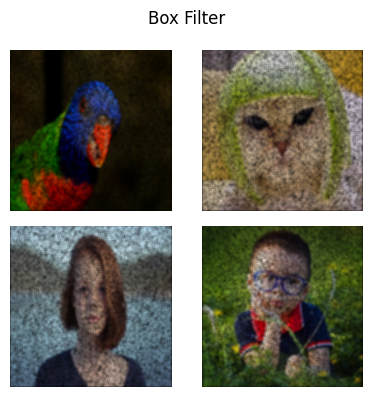

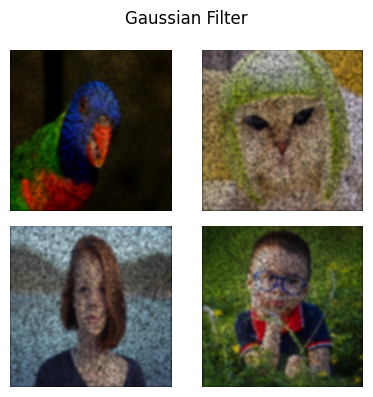

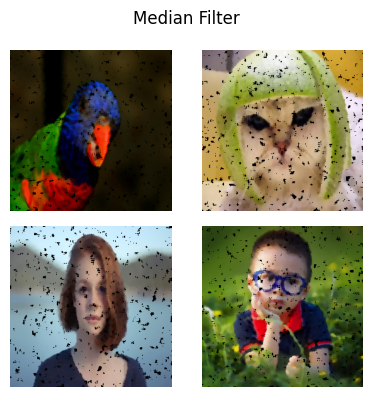

In [ ]:
# Write code here

print("----------------- Filters on Impulse noise with vaying Noise Prob ----------------\n\n")

for i in range(len(impulse_noisy_images_all)):
  box_filter_images_impulse = []
  gaussian_filter_images_impulse  = []
  median_filter_images_impulse = []
  for image in impulse_noisy_images_all[i]:
      box_filter_images_impulse.append(apply_box_filter(image, kernel_size=5))
      gaussian_filter_images_impulse.append(apply_gaussian_filter(image, kernel_size=7, sigma=2.0))
      median_filter_images_impulse.append(apply_median_filter(image, kernel_size=5))
  box_filter_images_impulse = np.array(box_filter_images_impulse)
  gaussian_filter_images_impulse = np.array(gaussian_filter_images_impulse)
  median_filter_images_impulse = np.array(median_filter_images_impulse)
  print(f"\nImplulse Noise with Noise Prob = {noise_probs[i]}\n")
  show_image_grid(box_filter_images_impulse, M=2, N=2, title='Box Filter')
  show_image_grid(gaussian_filter_images_impulse, M=2, N=2, title='Gaussian Filter')
  show_image_grid(median_filter_images_impulse, M=2, N=2, title='Median Filter')

----------------- Filters on Gaussian noise with vaying Mean ----------------



Gaussian Noise with Mean = 0 Std = 30



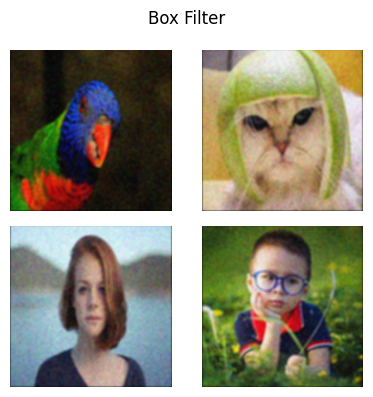

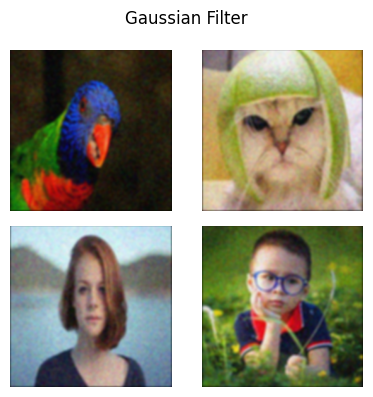

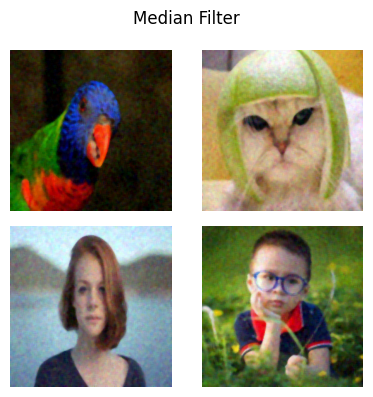


Gaussian Noise with Mean = 1 Std = 30



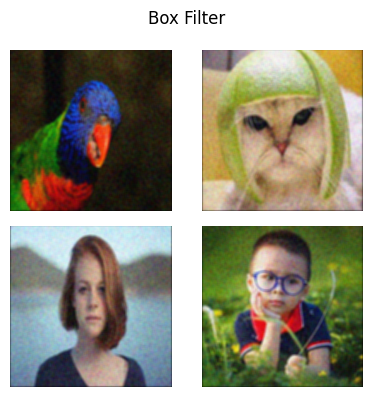

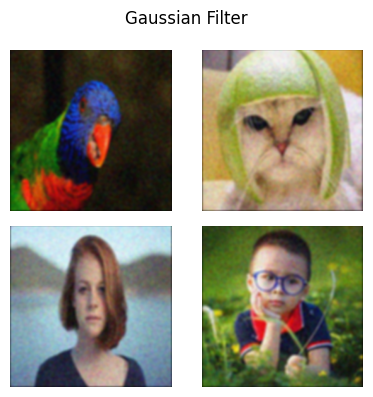

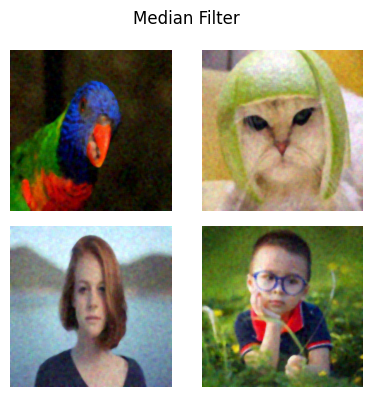


Gaussian Noise with Mean = 2 Std = 30



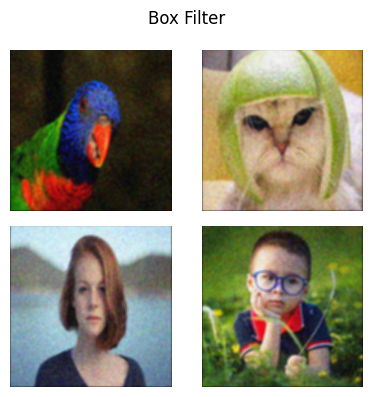

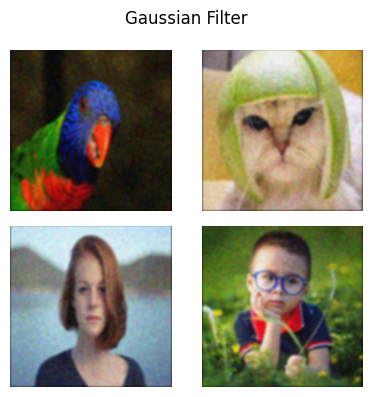

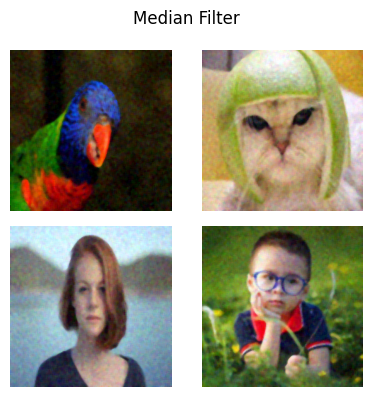


Gaussian Noise with Mean = 5 Std = 30



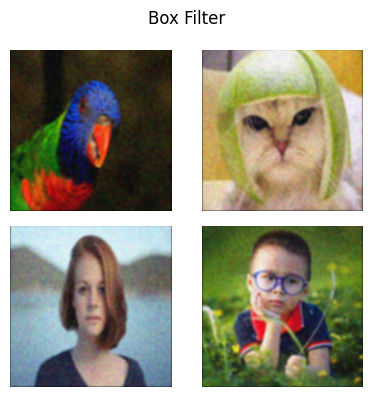

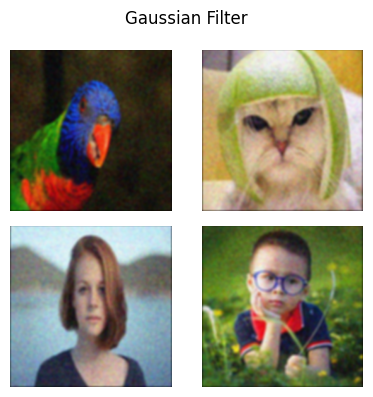

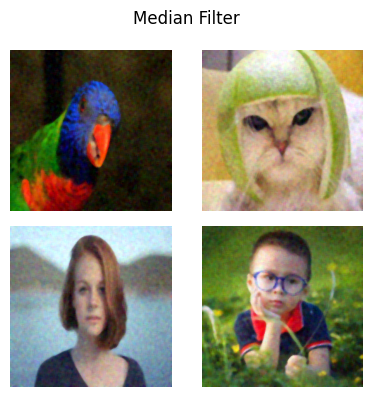

In [ ]:
# Write code here
print("----------------- Filters on Gaussian noise with vaying Mean ----------------\n\n")
for i in range(len(gaussian_noisy_images_mean_all)):
  box_filter_images_gaussian = []
  gaussian_filter_images_gaussian  = []
  median_filter_images_gaussian = []
  for image in gaussian_noisy_images_mean_all[i]:
      box_filter_images_gaussian.append(apply_box_filter(image, kernel_size=5))
      gaussian_filter_images_gaussian.append(apply_gaussian_filter(image, kernel_size=7, sigma=2.0))
      median_filter_images_gaussian.append(apply_median_filter(image, kernel_size=5))
  box_filter_images_gaussian = np.array(box_filter_images_gaussian)
  gaussian_filter_images_gaussian = np.array(gaussian_filter_images_gaussian)
  median_filter_images_gaussian = np.array(median_filter_images_gaussian)
  print(f"\nGaussian Noise with Mean = {means[i]} Std = 30\n")
  show_image_grid(box_filter_images_gaussian, M=2, N=2, title='Box Filter')
  show_image_grid(gaussian_filter_images_gaussian, M=2, N=2, title='Gaussian Filter')
  show_image_grid(median_filter_images_gaussian, M=2, N=2, title='Median Filter')

----------------- Filters on Gaussian noise with vaying Std ----------------



Gaussian Noise with Mean = 0 Std = 20



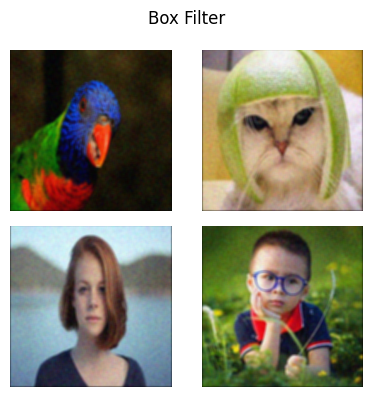

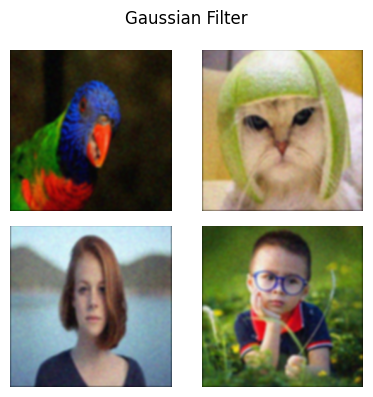

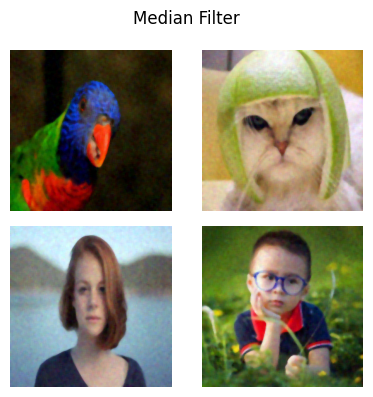


Gaussian Noise with Mean = 0 Std = 30



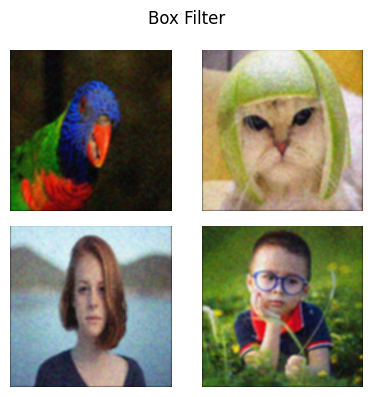

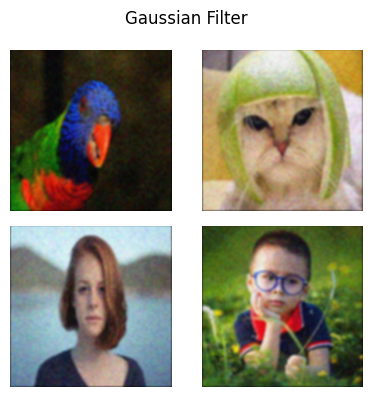

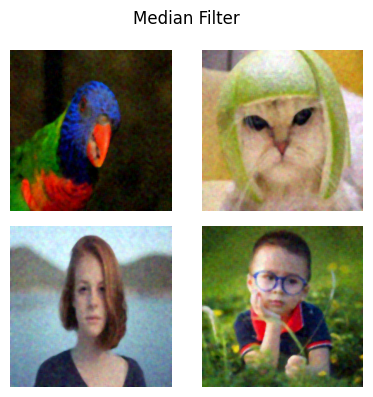


Gaussian Noise with Mean = 0 Std = 50



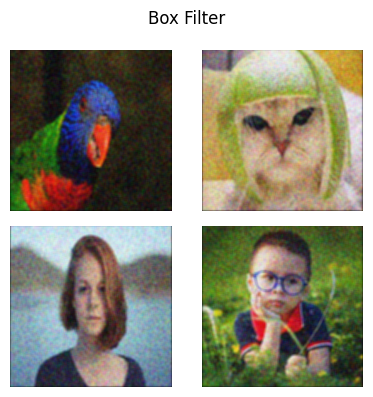

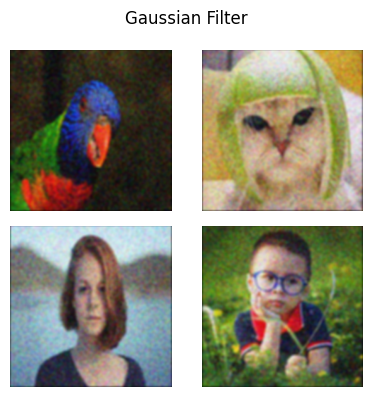

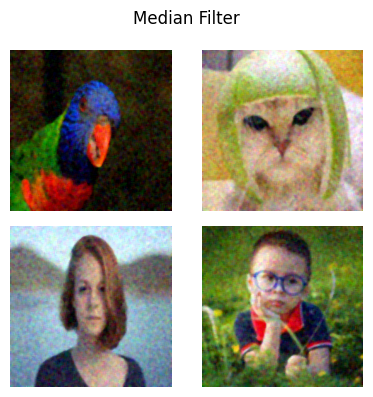


Gaussian Noise with Mean = 0 Std = 100



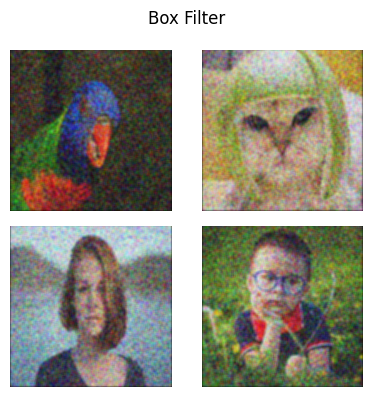

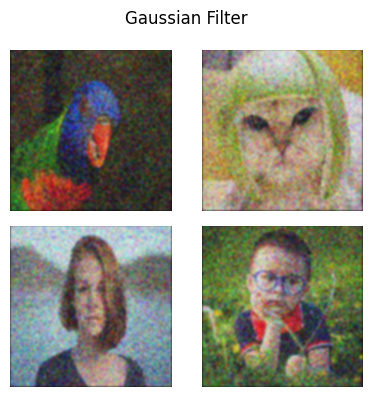

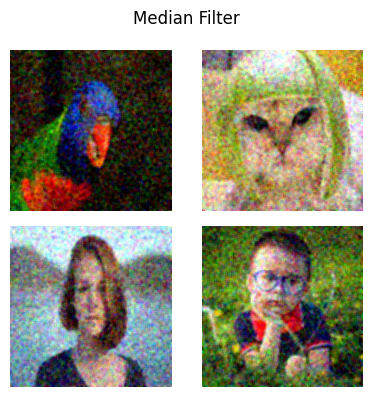

In [ ]:
# Write code here

print("----------------- Filters on Gaussian noise with vaying Std ----------------\n\n")
for i in range(len(gaussian_noisy_images_std_all)):
  box_filter_images_gaussian = []
  gaussian_filter_images_gaussian  = []
  median_filter_images_gaussian = []
  for image in gaussian_noisy_images_std_all[i]:
      box_filter_images_gaussian.append(apply_box_filter(image, kernel_size=5))
      gaussian_filter_images_gaussian.append(apply_gaussian_filter(image, kernel_size=7, sigma=2.0))
      median_filter_images_gaussian.append(apply_median_filter(image, kernel_size=5))
  box_filter_images_gaussian = np.array(box_filter_images_gaussian)
  gaussian_filter_images_gaussian = np.array(gaussian_filter_images_gaussian)
  median_filter_images_gaussian = np.array(median_filter_images_gaussian)
  print(f"\nGaussian Noise with Mean = 0 Std = {sigmas[i]}\n")
  show_image_grid(box_filter_images_gaussian, M=2, N=2, title='Box Filter')
  show_image_grid(gaussian_filter_images_gaussian, M=2, N=2, title='Gaussian Filter')
  show_image_grid(median_filter_images_gaussian, M=2, N=2, title='Median Filter')

In [ ]:
# For next question

impulse_noisy_images  = []
gaussian_noisy_images = []

for image in gt_images:
    impulse_noisy_images.append(add_impulse_noise(image, noise_prob=0.05))
    gaussian_noisy_images.append(add_gaussian_noise(image, mean=0., std=30))

impulse_noisy_images = np.array(impulse_noisy_images)
gaussian_noisy_images = np.array(gaussian_noisy_images)

box_filter_images_impulse       = []
gaussian_filter_images_impulse  = []
median_filter_images_impulse    = []

for image in impulse_noisy_images:
    box_filter_images_impulse.append(apply_box_filter(image, kernel_size=5))
    gaussian_filter_images_impulse.append(apply_gaussian_filter(image, kernel_size=7, sigma=2.0))
    median_filter_images_impulse.append(apply_median_filter(image, kernel_size=5))

box_filter_images_impulse = np.array(box_filter_images_impulse)
gaussian_filter_images_impulse = np.array(gaussian_filter_images_impulse)
median_filter_images_impulse = np.array(median_filter_images_impulse)


box_filter_images_gaussian       = []
gaussian_filter_images_gaussian  = []
median_filter_images_gaussian    = []

for image in gaussian_noisy_images:
    box_filter_images_gaussian.append(apply_box_filter(image, kernel_size=5))
    gaussian_filter_images_gaussian.append(apply_gaussian_filter(image, kernel_size=7, sigma=2.0))
    median_filter_images_gaussian.append(apply_median_filter(image, kernel_size=5))

box_filter_images_gaussian = np.array(box_filter_images_gaussian)
gaussian_filter_images_gaussian = np.array(gaussian_filter_images_gaussian)
median_filter_images_gaussian = np.array(median_filter_images_gaussian)


### Canny Edge Detector

In [ ]:
def apply_canny_edge_detector_opencv(image, threshold1, threshold2):

    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply the Canny edge detector
    edges = cv2.Canny(gray_image, threshold1, threshold2)

    # This is done only for converting 1 channel image to 3 channels for
    # visualization purpose in matplotlib
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)

    return edges


def apply_canny_edge_detector_self(image, threshold1, threshold2):

    m, n, c = image.shape
    ######## Convert to grayscale ########
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    ######### Smoothing ###############
    size = 5
    sigma = 2.5
    kernel = np.fromfunction(lambda x, y: (1/(2*np.pi*sigma**2)) * np.exp(-((x-size//2)**2 + (y-size//2)**2) / (2*sigma**2)), (size, size))
    kernel = kernel / np.sum(kernel)
    smoothened_image = convolve2d(gray_image, kernel, mode='same', boundary='symm', fillvalue=0)

    ######### Sobel filter ##########
    horizontal_filter = np.array([[-1, 0, 1],
                                  [-2, 0, 2],
                                  [-1, 0, 1]])
    vertical_filter = np.transpose(horizontal_filter)
    g_x = convolve2d(
        smoothened_image, horizontal_filter, mode='same', boundary='fill', fillvalue=0)
    g_y = convolve2d(
        smoothened_image, vertical_filter, mode='same', boundary='fill', fillvalue=0)
    edge_magnitude = np.sqrt(g_x ** 2 + g_y ** 2)
    edge_direction = np.arctan2(g_y, g_x)
    edge_direction[edge_direction < 0] += np.pi

    ########### Non Maximal Supression ###################
    suppressed_img = np.zeros_like(edge_magnitude)
    for x in range(1,m-1):
        for y in range(1,n-1):
            p = np.pi
            angle = edge_direction[x, y]

            if (0 <= angle < p/8) or (7*p/8 <= p):
                neighbor1_i, neighbor1_j = x, y + 1
                neighbor2_i, neighbor2_j = x, y - 1
            elif (p/8 <= angle < 3*p/8):
                neighbor1_i, neighbor1_j = x - 1, y + 1
                neighbor2_i, neighbor2_j = x + 1, y - 1
            elif (3*p/8 <= angle < 5*p/8):
                neighbor1_i, neighbor1_j = x - 1, y
                neighbor2_i, neighbor2_j = x + 1, y

            elif (5*p/8 <= angle < 7*p/8):
                neighbor1_i, neighbor1_j = x - 1, y - 1
                neighbor2_i, neighbor2_j = x + 1, y + 1

            current_mag = edge_magnitude[x, y]
            neighbor1_mag = edge_magnitude[neighbor1_i, neighbor1_j]
            neighbor2_mag = edge_magnitude[neighbor2_i, neighbor2_j]
            if (current_mag >= neighbor1_mag) and (current_mag >= neighbor2_mag):
                suppressed_img[x, y] = current_mag
            else:
                suppressed_img[x, y] = 0

    h = 0.3*suppressed_img.max()
    l = 0.1*h

   ######################### Hysterisis Thresholding ###############

    strong_edges = (suppressed_img >= h)
    weak_edges = (suppressed_img >= l) & (suppressed_img < h)

    edges = np.zeros_like(suppressed_img)
    edges[strong_edges] = 255

    ####################### Linking weak edges ######################

    for x in range(1,m-1):
        for y in range(1,n-1):
            if weak_edges[x, y]:
                if (strong_edges[x - 1:x + 2, y - 1:y + 2].any()):
                  edges[x, y] = 255


    edges = cv2.cvtColor(edges.astype(np.uint8), cv2.COLOR_GRAY2BGR)
    return edges

In [ ]:
threshold1 = 80
threshold2 = 180

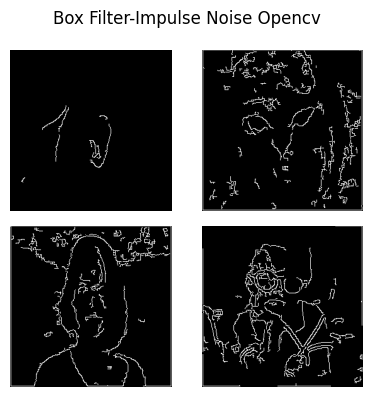

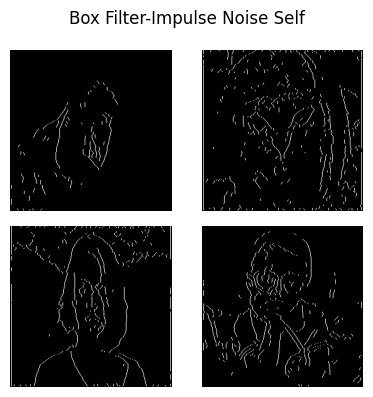

In [ ]:
canny_edge_opencv_box_filter_images_impulse = []
canny_edge_self_box_filter_images_impulse = []

for image in box_filter_images_impulse:
    canny_edge_opencv_box_filter_images_impulse.append(apply_canny_edge_detector_opencv(image, threshold1=threshold1, threshold2=threshold2))
    canny_edge_self_box_filter_images_impulse.append(apply_canny_edge_detector_self(image, threshold1=threshold1, threshold2=threshold2))

canny_edge_box_filter_images_impulse = np.array(canny_edge_opencv_box_filter_images_impulse)
canny_edge_self_box_filter_images_impulse = np.array(canny_edge_self_box_filter_images_impulse)

show_image_grid(canny_edge_box_filter_images_impulse, M=2, N=2, title='Box Filter-Impulse Noise Opencv')
show_image_grid(canny_edge_self_box_filter_images_impulse, M=2, N=2, title='Box Filter-Impulse Noise Self')

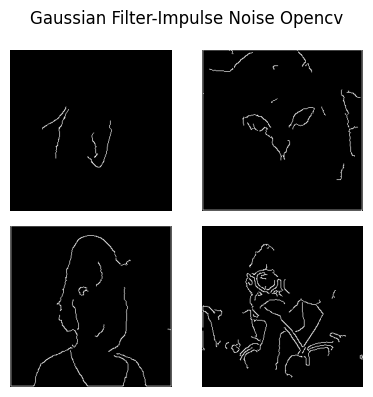

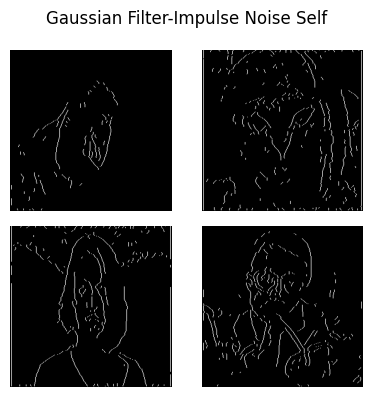

In [ ]:
canny_edge_opencv_gaussian_filter_images_impulse = []
canny_edge_self_gaussian_filter_images_impulse = []

for image in gaussian_filter_images_impulse:
    canny_edge_opencv_gaussian_filter_images_impulse.append(apply_canny_edge_detector_opencv(image, threshold1=threshold1, threshold2=threshold2))
    canny_edge_self_gaussian_filter_images_impulse.append(apply_canny_edge_detector_self(image, threshold1=threshold1, threshold2=threshold2))

canny_edge_gaussian_filter_images_impulse = np.array(canny_edge_opencv_gaussian_filter_images_impulse)
canny_edge_self_gaussian_filter_images_impulse = np.array(canny_edge_self_gaussian_filter_images_impulse)

show_image_grid(canny_edge_gaussian_filter_images_impulse, M=2, N=2, title='Gaussian Filter-Impulse Noise Opencv')
show_image_grid(canny_edge_self_gaussian_filter_images_impulse, M=2, N=2, title='Gaussian Filter-Impulse Noise Self')

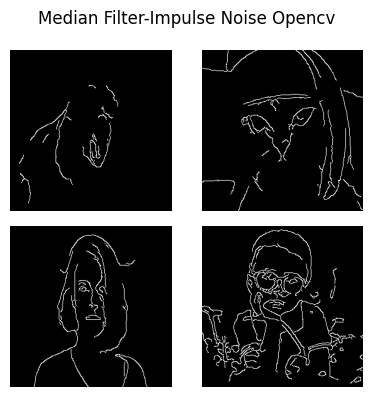

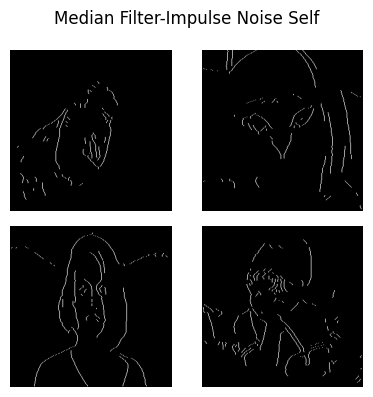

In [ ]:
canny_edge_opencv_median_filter_images_impulse = []
canny_edge_self_median_filter_images_impulse = []

for image in median_filter_images_impulse:
    canny_edge_opencv_median_filter_images_impulse.append(apply_canny_edge_detector_opencv(image, threshold1=threshold1, threshold2=threshold2))
    canny_edge_self_median_filter_images_impulse.append(apply_canny_edge_detector_self(image, threshold1=threshold1, threshold2=threshold2))

canny_edge_median_filter_images_impulse = np.array(canny_edge_opencv_median_filter_images_impulse)
canny_edge_self_median_filter_images_impulse = np.array(canny_edge_self_median_filter_images_impulse)

show_image_grid(canny_edge_median_filter_images_impulse, M=2, N=2, title='Median Filter-Impulse Noise Opencv')
show_image_grid(canny_edge_self_median_filter_images_impulse, M=2, N=2, title='Median Filter-Impulse Noise Self')

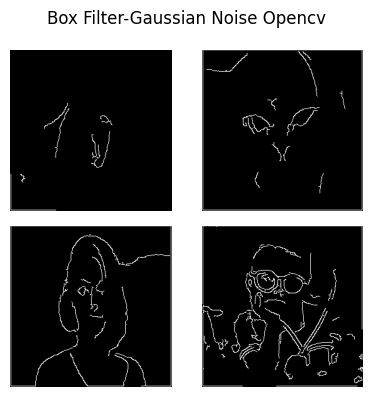

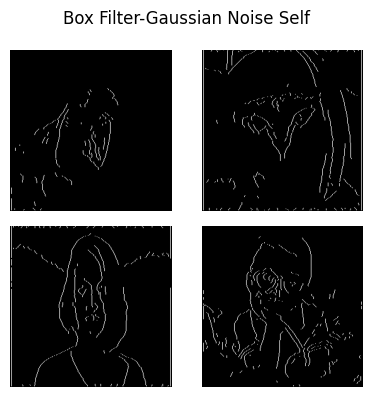

In [ ]:
canny_edge_opencv_box_filter_images_gaussian = []
canny_edge_self_box_filter_images_gaussian = []

for image in box_filter_images_gaussian:
    canny_edge_opencv_box_filter_images_gaussian.append(apply_canny_edge_detector_opencv(image, threshold1=threshold1, threshold2=threshold2))
    canny_edge_self_box_filter_images_gaussian.append(apply_canny_edge_detector_self(image, threshold1=threshold1, threshold2=threshold2))

canny_edge_box_filter_images_gaussian = np.array(canny_edge_opencv_box_filter_images_gaussian)
canny_edge_self_box_filter_images_gaussian = np.array(canny_edge_self_box_filter_images_gaussian)

show_image_grid(canny_edge_box_filter_images_gaussian, M=2, N=2, title='Box Filter-Gaussian Noise Opencv')
show_image_grid(canny_edge_self_box_filter_images_gaussian, M=2, N=2, title='Box Filter-Gaussian Noise Self')

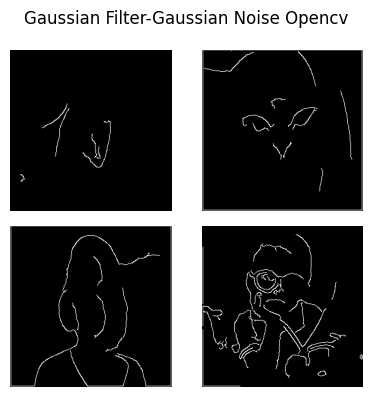

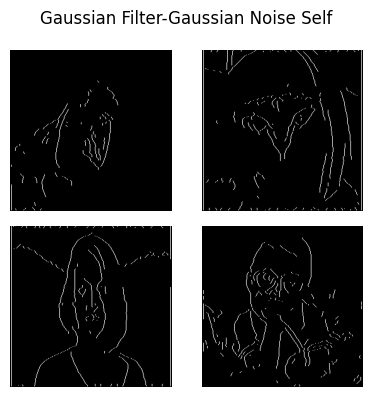

In [ ]:
canny_edge_opencv_gaussian_filter_images_gaussian = []
canny_edge_self_gaussian_filter_images_gaussian = []

for image in gaussian_filter_images_gaussian:
    canny_edge_opencv_gaussian_filter_images_gaussian.append(apply_canny_edge_detector_opencv(image, threshold1=threshold1, threshold2=threshold2))
    canny_edge_self_gaussian_filter_images_gaussian.append(apply_canny_edge_detector_self(image, threshold1=threshold1, threshold2=threshold2))

canny_edge_gaussian_filter_images_gaussian = np.array(canny_edge_opencv_gaussian_filter_images_gaussian)
canny_edge_self_gaussian_filter_images_gaussian = np.array(canny_edge_self_gaussian_filter_images_gaussian)

show_image_grid(canny_edge_gaussian_filter_images_gaussian, M=2, N=2, title='Gaussian Filter-Gaussian Noise Opencv')
show_image_grid(canny_edge_self_gaussian_filter_images_gaussian, M=2, N=2, title='Gaussian Filter-Gaussian Noise Self')

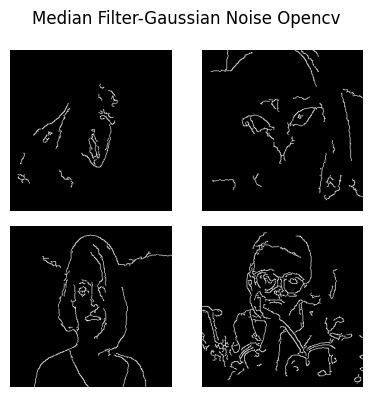

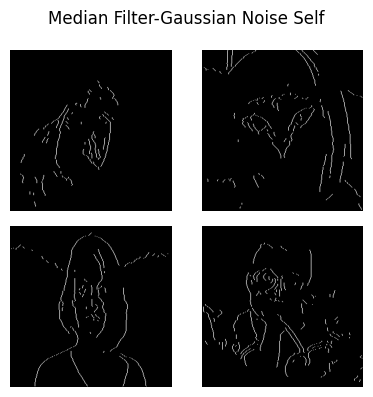

In [ ]:
canny_edge_opencv_median_filter_images_gaussian = []
canny_edge_self_median_filter_images_gaussian = []

for image in median_filter_images_gaussian:
    canny_edge_opencv_median_filter_images_gaussian.append(apply_canny_edge_detector_opencv(image, threshold1=threshold1, threshold2=threshold2))
    canny_edge_self_median_filter_images_gaussian.append(apply_canny_edge_detector_self(image, threshold1=threshold1, threshold2=threshold2))

canny_edge_median_filter_images_gaussian = np.array(canny_edge_opencv_median_filter_images_gaussian)
canny_edge_self_median_filter_images_gaussian = np.array(canny_edge_self_median_filter_images_gaussian)

show_image_grid(canny_edge_median_filter_images_gaussian, M=2, N=2, title='Median Filter-Gaussian Noise Opencv')
show_image_grid(canny_edge_self_median_filter_images_gaussian, M=2, N=2, title='Median Filter-Gaussian Noise Self')

In [ ]:
####
# RMSE table of size 6 x 4
rmse_data = np.empty((6,4))

for i in range(4):
  rmse_data[0][i] = np.sqrt(np.mean((canny_edge_opencv_box_filter_images_impulse[i]-canny_edge_self_box_filter_images_impulse[i])**2))

for i in range(4):
  rmse_data[1][i] = np.sqrt(np.mean((canny_edge_opencv_gaussian_filter_images_impulse[i]-canny_edge_self_gaussian_filter_images_impulse[i])**2))

for i in range(4):
  rmse_data[2][i] = np.sqrt(np.mean((canny_edge_opencv_median_filter_images_impulse[i]-canny_edge_self_median_filter_images_impulse[i])**2))

for i in range(4):
  rmse_data[3][i] = np.sqrt(np.mean((canny_edge_opencv_box_filter_images_gaussian[i]-canny_edge_self_box_filter_images_gaussian[i])**2))

for i in range(4):
  rmse_data[4][i] = np.sqrt(np.mean((canny_edge_opencv_gaussian_filter_images_gaussian[i]-canny_edge_self_gaussian_filter_images_gaussian[i])**2))

for i in range(4):
  rmse_data[5][i] = np.sqrt(np.mean((canny_edge_opencv_median_filter_images_gaussian[i]-canny_edge_self_median_filter_images_gaussian[i])**2))

In [ ]:
print("1 : Impluse Noise     2: Gaussian Noise")
print("a : Box filter        b: Gaussian filter      c: Median filter")
rmse_data_pd = pd.DataFrame(rmse_data,index = ['1a','1b','1c','2a','2b','2c'],columns=['Img 1','Img 2','Img 3', 'Img 4'])
rmse_data_pd

1 : Impluse Noise     2: Gaussian Noise
a : Box filter        b: Gaussian filter      c: Median filter


,Img 1,Img 2,Img 3,Img 4
1a,0.108745,0.287448,0.259553,0.259553
1b,0.096872,0.220071,0.201314,0.188636
1c,0.112538,0.164620,0.146471,0.232906
2a,0.115482,0.215765,0.211263,0.243225
2b,0.100277,0.206182,0.192757,0.191804
2c,0.126637,0.160299,0.157563,0.231229
